In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from fastai.vision.all import *
from sklearn.metrics import confusion_matrix

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
set_seed(99, True)

In [3]:
data = {'Path': [], 'Class': []}

dataset_path = '/kaggle/input/5cleaned-dataset-week5/5cleaned dataset_week5'
entries = os.listdir(dataset_path)

for entry in entries:
    full_path = os.path.join(dataset_path, entry)
    if os.path.isdir(full_path):
        files = os.listdir(full_path)
        for file in files:
            file_path = os.path.join(full_path, file)
            
            data['Path'].append(os.path.join(entry, file))
            data['Class'].append(entry)

df = pd.DataFrame(data)

In [4]:
df['Class'].value_counts()

Class
burn wound          367
bruises wound       153
abrasion wound      102
laceration wound    100
cut wound            88
Stab_wound           60
Name: count, dtype: int64

In [5]:
df.Class = df.Class.str.replace('abrasion wound', 'Abrasion')
df.Class = df.Class.str.replace('bruises wound', 'Contusion of bruise')
df.Class = df.Class.str.replace('burn wound', 'Burns')
df.Class = df.Class.str.replace('cut wound', 'Cut or incised wound')
df.Class = df.Class.str.replace('Stab_wound', 'Stab wound')
df.Class = df.Class.str.replace('laceration wound', 'Lacerated wound')
df = df.sort_values(by='Class')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


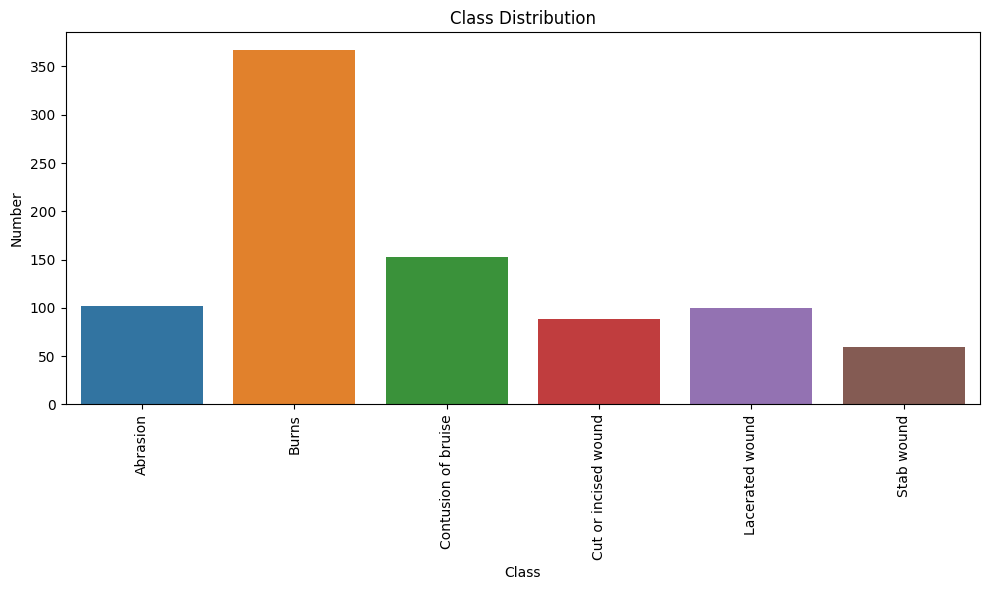

In [6]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Class')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Number')
plt.xticks(rotation=90)

plt.tight_layout()
plt.savefig('/kaggle/working/class-distribution.png')
plt.show()

In [7]:
# dataloaders = ImageDataLoaders.from_df(df,
#                                       path=dataset_path,
#                                       fn_col='Path',
#                                       label_col='Class',
#                                       item_tfms=Resize(224),
#                                       batch_tfms=aug_transforms())

In [8]:
input_folder = '/kaggle/input/06splitted-dataset-week5/content/06splitted_dataset_week5'

In [9]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock), #x - image; y - single class
    get_items=get_image_files, #get image
    splitter=GrandparentSplitter(valid_name='val'), #use parent folder as train-valid split -> belong to train folder or valid mini folder
    get_y=parent_label, #use parent folder as label
    item_tfms = Resize(244),
    batch_tfms=aug_transforms(size=224)
    )
dls = dblock.dataloaders(input_folder, bs=64)

In [10]:
dls.vocab

['Stab_wound', 'abrasion wound', 'bruises wound', 'burn wound', 'cut wound', 'laceration wound']

In [11]:
learn = vision_learner(dls, resnet34, 
                       metrics=[error_rate, accuracy, F1Score(average='macro'), Precision(average='macro'), Recall(average='macro')])

learn.recorder.train_metrics = True
learn.recorder.valid_metrics = True
recorder = learn.recorder

learn.fine_tune(20,cbs=CSVLogger(fname='history.csv', append=False))

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 174MB/s] 


epoch,train_loss,train_error_rate,train_accuracy,train_f1_score,train_precision_score,train_recall_score,valid_loss,valid_error_rate,valid_accuracy,valid_f1_score,valid_precision_score,valid_recall_score,time
0,2.677611,0.790625,0.209375,0.187889,0.208122,0.205370,1.219020,0.411765,0.588235,0.494608,0.493218,0.505093,00:07


epoch,train_loss,train_error_rate,train_accuracy,train_f1_score,train_precision_score,train_recall_score,valid_loss,valid_error_rate,valid_accuracy,valid_f1_score,valid_precision_score,valid_recall_score,time
0,1.840582,0.560938,0.439063,0.373924,0.378084,0.389775,1.242273,0.423529,0.576471,0.487853,0.480507,0.513426,00:06
1,1.663629,0.482812,0.517187,0.445181,0.439567,0.467263,1.080775,0.341176,0.658824,0.585412,0.594841,0.604630,00:06
2,1.483086,0.410937,0.589063,0.493897,0.489773,0.510676,0.916106,0.247059,0.752941,0.692635,0.685354,0.706481,00:06
3,1.273379,0.296875,0.703125,0.629383,0.619159,0.646141,0.838385,0.258824,0.741176,0.666635,0.684103,0.660185,00:06
4,1.099559,0.203125,0.796875,0.736854,0.729268,0.746668,0.694533,0.176471,0.823529,0.795606,0.795544,0.806944,00:06
5,0.933248,0.160938,0.839063,0.776042,0.770212,0.782433,0.743285,0.211765,0.788235,0.737790,0.747561,0.751389,00:06
6,0.795645,0.123438,0.876562,0.828705,0.830925,0.829783,0.749969,0.188235,0.811765,0.772479,0.774116,0.783796,00:06
7,0.683481,0.104687,0.895312,0.840589,0.840519,0.841782,0.761254,0.176471,0.823529,0.787630,0.784410,0.800463,00:06
8,0.584396,0.081250,0.918750,0.878837,0.885408,0.874504,0.803823,0.200000,0.800000,0.751850,0.752938,0.768056,00:06
9,0.513439,0.064062,0.935938,0.905924,0.908751,0.904582,0.747011,0.211765,0.788235,0.736572,0.735022,0.751389,00:06


In [12]:
# recorder.plot_loss()

                  precision    recall  f1-score   support

      Stab_wound       0.67      0.67      0.67         6
  abrasion wound       0.75      0.60      0.67        10
   bruises wound       0.73      0.73      0.73        15
      burn wound       0.86      0.86      0.86        36
       cut wound       0.64      0.88      0.74         8
laceration wound       0.67      0.60      0.63        10

        accuracy                           0.76        85
       macro avg       0.72      0.72      0.72        85
    weighted avg       0.77      0.76      0.76        85



[('Stab_wound', 'burn wound', 2),
 ('abrasion wound', 'bruises wound', 2),
 ('laceration wound', 'cut wound', 2),
 ('abrasion wound', 'burn wound', 1),
 ('abrasion wound', 'laceration wound', 1),
 ('bruises wound', 'Stab_wound', 1),
 ('bruises wound', 'abrasion wound', 1),
 ('bruises wound', 'burn wound', 1),
 ('bruises wound', 'cut wound', 1),
 ('burn wound', 'Stab_wound', 1),
 ('burn wound', 'abrasion wound', 1),
 ('burn wound', 'bruises wound', 1),
 ('burn wound', 'cut wound', 1),
 ('burn wound', 'laceration wound', 1),
 ('cut wound', 'laceration wound', 1),
 ('laceration wound', 'bruises wound', 1),
 ('laceration wound', 'burn wound', 1)]

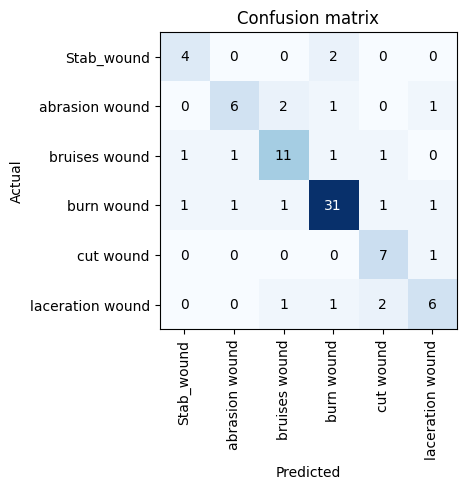

In [13]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()
interp.print_classification_report()
interp.most_confused()

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


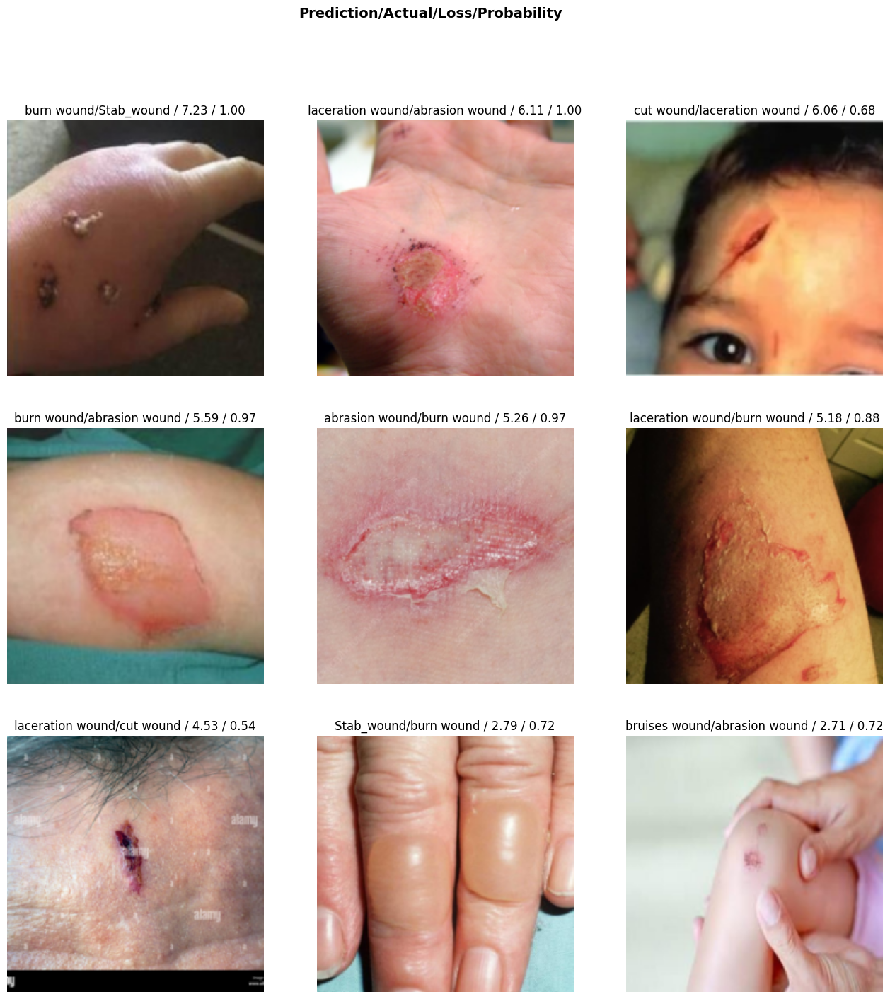

In [14]:
interp.plot_top_losses(9, figsize= (16,16))

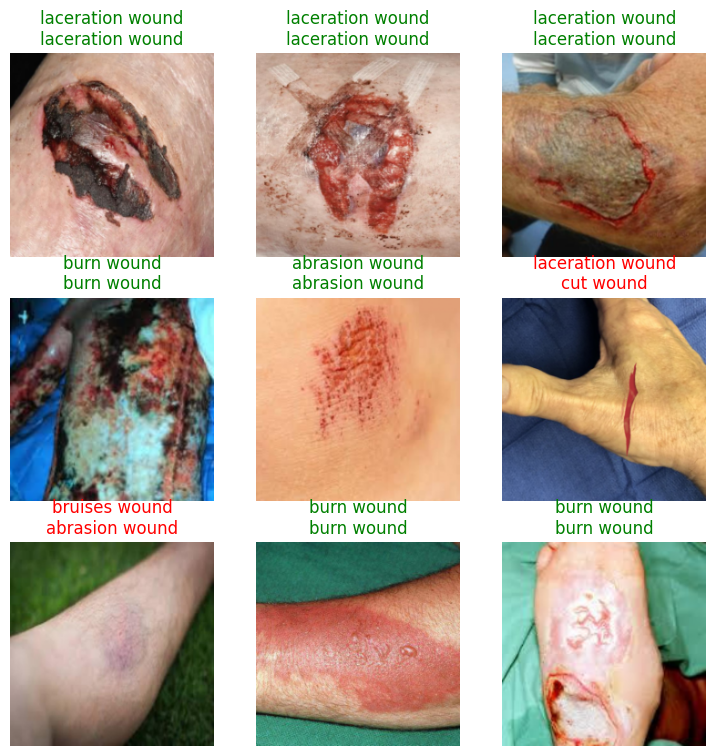

In [15]:
learn.show_results()

In [16]:
learn.export('/kaggle/working/normal-baseline-model.pkl')

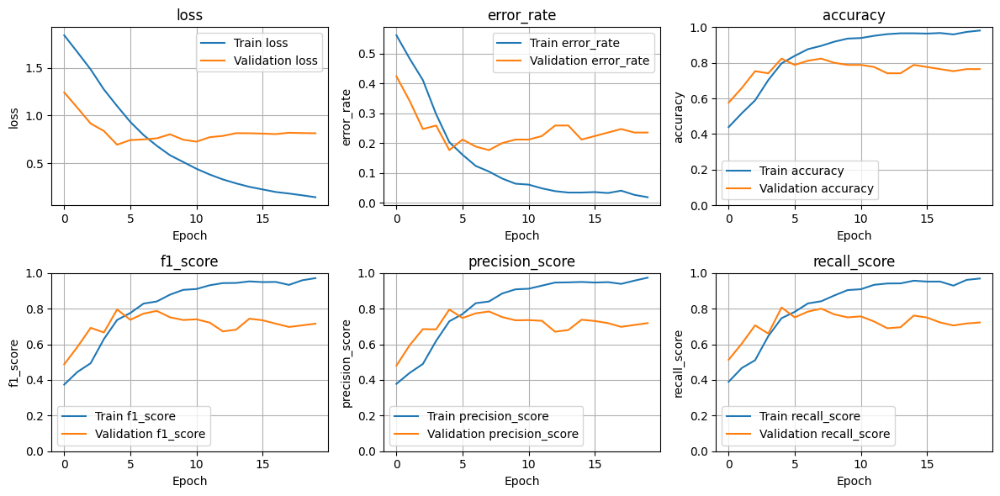

In [17]:
history_df = pd.read_csv("history.csv")
metrics_to_plot = ["loss","error_rate", "accuracy", "f1_score", "precision_score", "recall_score"]

rows = 2
cols = int(len(metrics_to_plot) / rows) + (len(metrics_to_plot) % rows > 0)
fig, axes = plt.subplots(rows, cols, figsize=(12, 6))  
axes_flat = axes.flatten()

for metric, ax in zip(metrics_to_plot, axes_flat):
    
    train_metric = history_df[f"train_{metric}"]
    val_metric = history_df[f"valid_{metric}"]

    ax.plot(train_metric, label=f"Train {metric}")
    ax.plot(val_metric, label=f"Validation {metric}")
    ax.set_xlabel("Epoch")
    ax.set_ylabel(metric)
    ax.set_title(f"{metric}")
    ax.legend()
    ax.grid(True)
    if metric in ["accuracy", "f1_score", "precision_score", "recall_score"]:
        ax.set_ylim(0, 1)
        
plt.tight_layout()
plt.show()

In [18]:
test_dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=GrandparentSplitter(valid_name='test'),
    get_y=parent_label,
    item_tfms=Resize(244)
    )
test_dls = test_dblock.dataloaders(input_folder, bs=64)

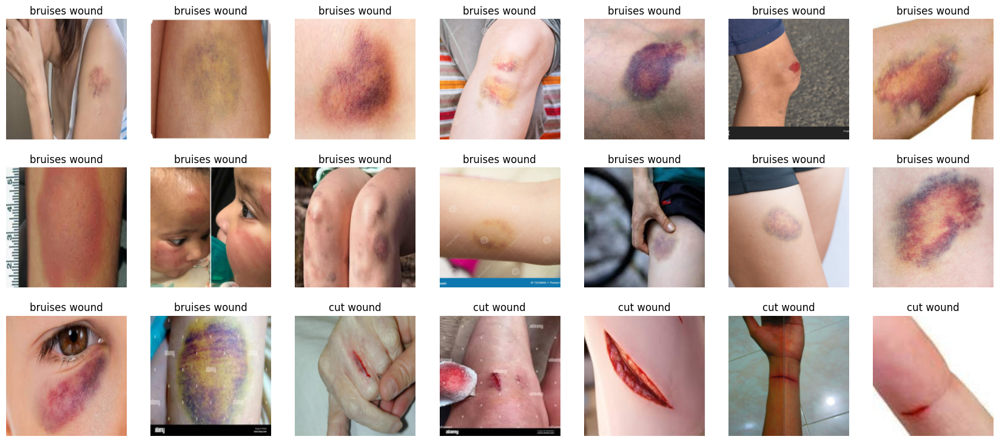

In [19]:
test_dls[1].show_batch(max_n=21, nrows=3)

                  precision    recall  f1-score   support

      Stab_wound       0.50      0.67      0.57         6
  abrasion wound       0.80      0.36      0.50        11
   bruises wound       0.48      0.94      0.64        16
      burn wound       0.80      0.74      0.77        38
       cut wound       0.60      0.60      0.60        10
laceration wound       0.50      0.10      0.17        10

        accuracy                           0.64        91
       macro avg       0.61      0.57      0.54        91
    weighted avg       0.67      0.64      0.61        91



[('burn wound', 'bruises wound', 8),
 ('abrasion wound', 'bruises wound', 4),
 ('laceration wound', 'burn wound', 4),
 ('laceration wound', 'cut wound', 3),
 ('abrasion wound', 'burn wound', 2),
 ('burn wound', 'Stab_wound', 2),
 ('cut wound', 'bruises wound', 2),
 ('laceration wound', 'bruises wound', 2),
 ('Stab_wound', 'burn wound', 1),
 ('Stab_wound', 'laceration wound', 1),
 ('abrasion wound', 'cut wound', 1),
 ('bruises wound', 'Stab_wound', 1),
 ('cut wound', 'Stab_wound', 1),
 ('cut wound', 'abrasion wound', 1)]

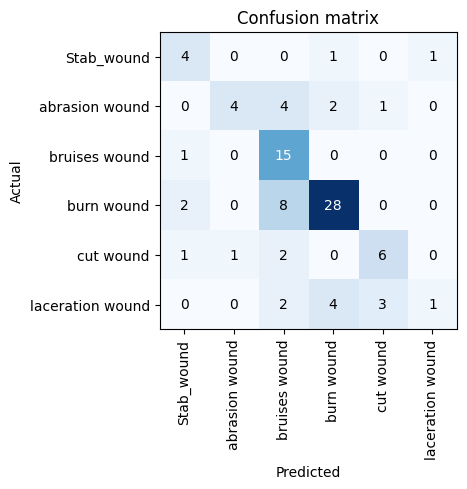

In [20]:
test_interp = ClassificationInterpretation.from_learner(learn, dl=test_dls.valid)
# test_interp = ClassificationInterpretation.from_learner(learn, dl=test_dls[1])
test_interp.plot_confusion_matrix()
test_interp.print_classification_report()
test_interp.most_confused()

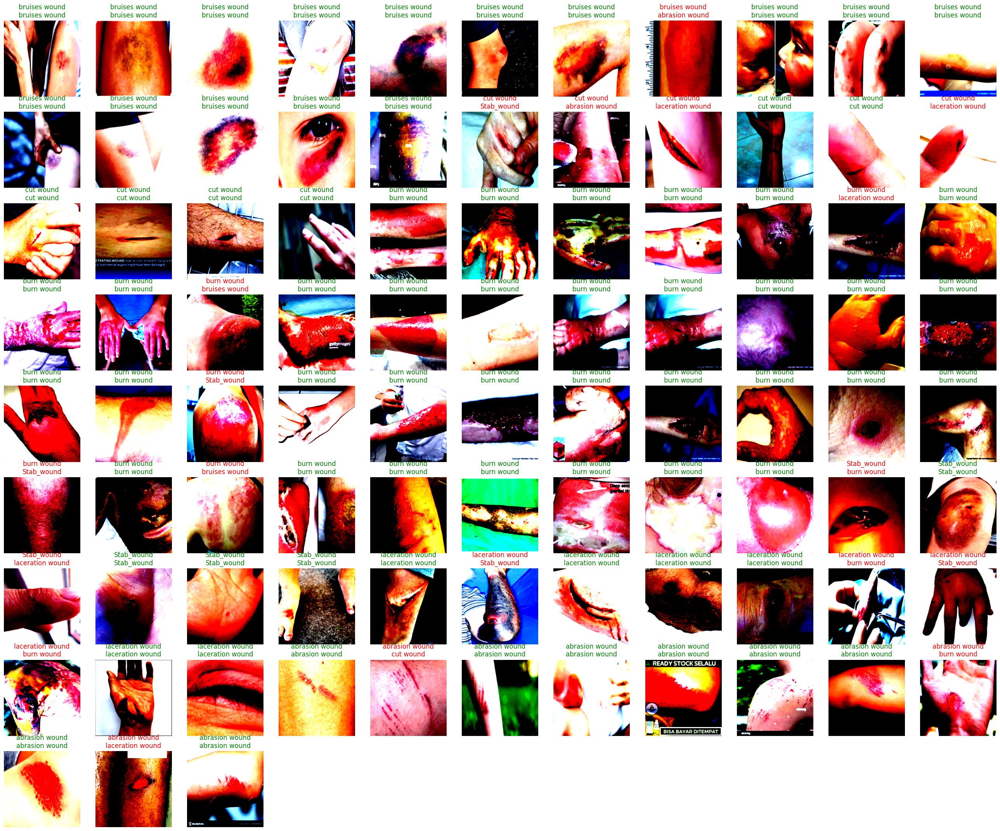

In [21]:
test_interp.show_results(list(range(91)))

In [22]:
import os

def predict_all_images(test_folder, model):
  results = []  

  for subfolder in os.listdir(test_folder):
    actual_class = subfolder

    if os.path.isdir(os.path.join(test_folder, subfolder)):
      for filename in os.listdir(os.path.join(test_folder, subfolder)):
        image_path = os.path.join(test_folder, subfolder, filename)

        pred_class, class_num, prob = learn.predict(image_path)
        
        result = {
            "actual_class": actual_class,
            "predicted_class": pred_class,
#             "image_path":image_path,
            "filename": filename,
            "probability": float(max(prob))  # Add probability if available from the model's output
        }
        results.append(result)

  return results

model = learn
# class_labels = ["abrasion", "bruise", "burn", "cut", "laceration", "stab"]
test_folder = input_folder+'/test'

predictions = predict_all_images(test_folder, model)

df = pd.DataFrame(predictions)
df = df.sort_values(by=['actual_class', 'filename'])

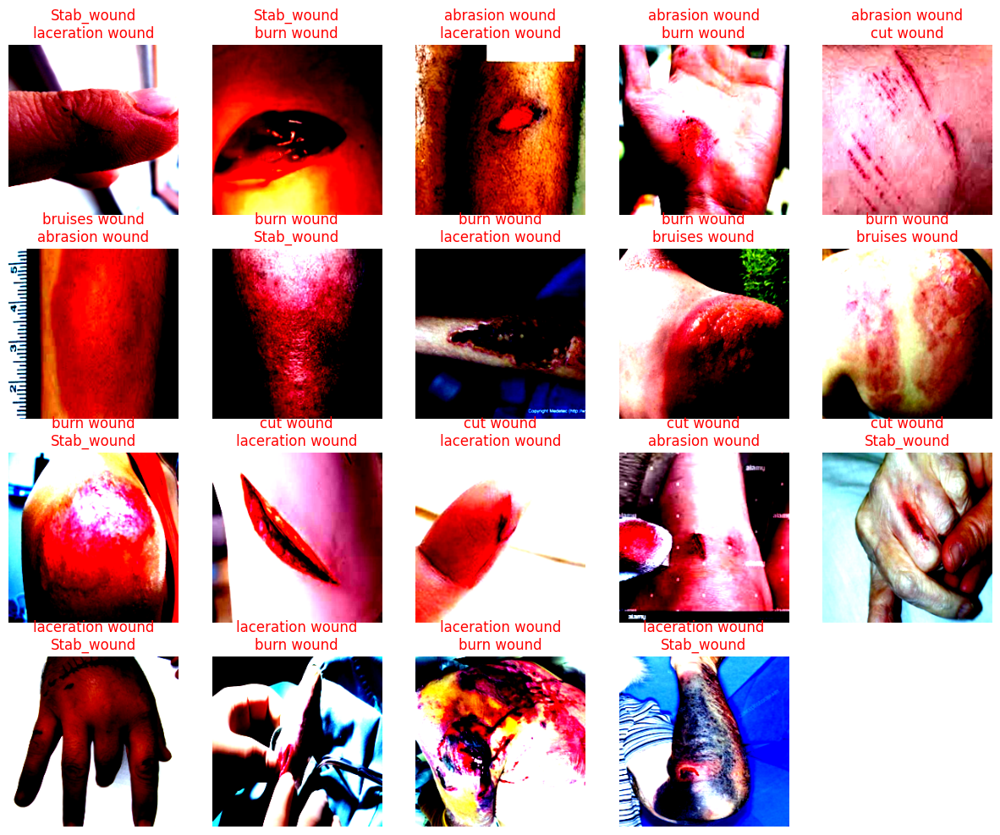

In [23]:
incorrect_indices = df[df['actual_class'] != df['predicted_class']].index.tolist()
test_interp.show_results(incorrect_indices)

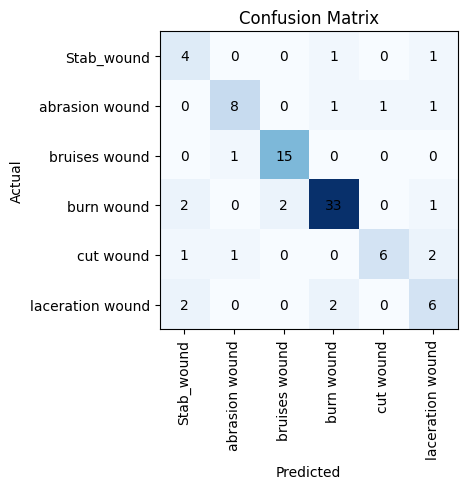

In [24]:
class_labels = test_dls.vocab
confusion_matrix = pd.crosstab(df['actual_class'], df['predicted_class'], rownames=['Actual'], colnames=['Predicted'])

fig, ax = plt.subplots(figsize=(5, 5)) 
ax.imshow(confusion_matrix, cmap=plt.cm.Blues) 

ax.set_xticks(np.arange(len(class_labels)))
ax.set_yticks(np.arange(len(class_labels)))
ax.set_xticklabels(class_labels, rotation=90)
ax.set_yticklabels(class_labels)
ax.set_title('Confusion Matrix')
for i in range(len(class_labels)):
    for j in range(len(class_labels)):
        ax.text(j, i, str(confusion_matrix.iloc[i, j]), ha="center", va="center")
        
ax.set_ylabel('Actual')
ax.set_xlabel('Predicted')

plt.tight_layout()
plt.show()

In [25]:
len(df.loc[df.actual_class == df.predicted_class])/len(df)

0.7912087912087912

In [26]:
from sklearn.metrics import classification_report
import pandas as pd

def print_classification_report(actual, predicted, labels):
    report = classification_report(actual, predicted, target_names=labels, output_dict=True)
    
    print("{:<20} {:<10} {:<10} {:<10} {:<10}".format('Class', 'Precision', 'Recall', 'F1-Score', 'Support'))
    
    for label in labels:
        precision = report[label]['precision']
        recall = report[label]['recall']
        f1_score = report[label]['f1-score']
        support = report[label]['support']
        print("{:<20} {:<10.2f} {:<10.2f} {:<10.2f} {:<10}".format(label, precision, recall, f1_score, support))
    
    accuracy = report['accuracy']
    macro_avg_precision = report['macro avg']['precision']
    macro_avg_recall = report['macro avg']['recall']
    macro_avg_f1_score = report['macro avg']['f1-score']
    macro_avg_support = report['macro avg']['support']
    weighted_avg_precision = report['weighted avg']['precision']
    weighted_avg_recall = report['weighted avg']['recall']
    weighted_avg_f1_score = report['weighted avg']['f1-score']
    weighted_avg_support = report['weighted avg']['support']
    
    print("{:<20} {:<10.2f} {:<10} {:<10} {:<10}".format('accuracy', accuracy, '', '', ''))
    print("{:<20} {:<10.2f} {:<10.2f} {:<10.2f} {:<10}".format('macro avg', macro_avg_precision, macro_avg_recall, macro_avg_f1_score, macro_avg_support))
    print("{:<20} {:<10.2f} {:<10.2f} {:<10.2f} {:<10}".format('weighted avg', weighted_avg_precision, weighted_avg_recall, weighted_avg_f1_score, weighted_avg_support))

actual = df['actual_class']
predicted = df['predicted_class']
labels = df['actual_class'].unique()

print_classification_report(actual, predicted, labels)

Class                Precision  Recall     F1-Score   Support   
Stab_wound           0.44       0.67       0.53       6         
abrasion wound       0.80       0.73       0.76       11        
bruises wound        0.88       0.94       0.91       16        
burn wound           0.89       0.87       0.88       38        
cut wound            0.86       0.60       0.71       10        
laceration wound     0.55       0.60       0.57       10        
accuracy             0.79                                       
macro avg            0.74       0.73       0.73       91        
weighted avg         0.81       0.79       0.79       91        


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp